## Import Dependencies And Files

In [ ]:
import tensorflow as tf
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import zipfile
import os

# Path to the zip files in Google Drive
train_zip_path = '/content/drive/My Drive/Image Captioning Dataset/Train.zip'
test_zip_path = '/content/drive/My Drive/Image Captioning Dataset/Test.zip'
caption_zip_path = '/content/drive/My Drive/Image Captioning Dataset/captions.txt.zip'
glove_zip_path = '/content/drive/My Drive/Image Captioning Dataset/glove.6B.50d.txt.zip'
# Destination folder
extract_path = '/content/Dataset'

# Unzipping
with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(test_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(caption_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(glove_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [ ]:
def ReadFile(path):
  with open(path,'r') as f:
    caption = f.read()
    return caption



## 2. Cleaning Captions

In [ ]:
captions = ReadFile('/content/Dataset/captions.txt')

In [34]:
captions

'image,caption\n1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg,A girl going into a wooden building .\n1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .\n1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .\n1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .\n1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting\n1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .\n1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .\n1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .\n1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .\n1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .\n10026741

In [ ]:
captions_list = captions.split('\n')

In [ ]:
captions_list = captions_list[1:]

In [ ]:
captions_list[:10]

['1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg,A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .',
 '1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting',
 '1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .',
 '1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .',
 '1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .',
 '1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .']

In [ ]:
captions_dict = {}
for item in captions_list:
    if item:  # Check if item is not empty
        x = item.split(",")
        if len(x) > 1:  # Check if there's more than one element after split
            key = x[0]
            value = x[1]
            if captions_dict.get(key) is None:
                captions_dict[key] = []
            captions_dict[key].append(value)

In [ ]:
captions_dict['2095078658_c14ba89bc2.jpg']

['A dog runs through snow in front of the woods .',
 'Large dog running in snow',
 'The dog runs through the snow .',
 'The German shepherd dog is running through the snow .',
 'The German Shepherd is running through the white snow .']

In [ ]:
import nltk
nltk.download('stopwords') # Download stopwords if not already downloaded
from nltk.corpus import stopwords
import re




def to_lower_case(text):
    return text.lower()

def remove_punc(text):
    re.sub('[^a-z]+','', text)
    text = text.split()

    text  = [s for s in text if len(s)>1]
    text = " ".join(text)
    return text
# stopwords_list = stopwords.words('english') # Now stopwords is defined and can be used
# def remove_stopwords(text):
#     text_words = [word for word in text.split() if ((word not in stopwords_list) and (len(word) > 2))]
#     text = " ".join(text_words)
#     return text

# def remove_numbers(text):
#     return re.sub(r'[0-9]', '', text)

# def remove_multiple_spaces(text):
#     return re.sub(' +', ' ', text).strip()

def clean_text(text):

    text = to_lower_case(text)
    text = remove_punc(text)
    # text = remove_stopwords(text)
    # text = remove_numbers(text)
    # text = remove_multiple_spaces(text)
    return text

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
captions_dict_cleaned = {}
for key, values in captions_dict.items():
  cleaned_values = [clean_text(value) for value in values]
  captions_dict_cleaned[key] = cleaned_values

In [ ]:
captions_dict_cleaned['2095078658_c14ba89bc2.jpg']

['dog runs through snow in front of the woods',
 'large dog running in snow',
 'the dog runs through the snow',
 'the german shepherd dog is running through the snow',
 'the german shepherd is running through the white snow']

In [ ]:
len(captions_dict_cleaned.keys()), len(captions_dict_cleaned.values())

(8091, 8091)

## 3. Split Train and Test Caption

In [ ]:
train_dict = {}
for img_name in os.listdir('/content/Dataset/Train/'):
  for keys, values in captions_dict_cleaned.items():
   if img_name in keys:
    train_dict[img_name] = values



In [ ]:
train_dict['2095078658_c14ba89bc2.jpg']

['dog runs through snow in front of the woods',
 'large dog running in snow',
 'the dog runs through the snow',
 'the german shepherd dog is running through the snow',
 'the german shepherd is running through the white snow']

In [ ]:
test_dict = {}
for img_name in os.listdir('/content/Dataset/Test/'):
 for keys, values in captions_dict_cleaned.items():
  if img_name in keys:
    test_dict[img_name] = values



In [ ]:
test_dict['3582814058_564776f26c.jpg']

['group of kids and two adults stand before graffiti wall',
 'group of people standing in front of graffitied wall',
 'six individuals of varying ages stand in front of stone wall covered in graffiti',
 'six people are posing for picture in front of wall with graffiti',
 'some young boys pose with man and woman by some graffiti']

In [ ]:
train_descriptions = {}
for img_name in train_dict.keys():
    train_descriptions[img_name] = []
    for cap in train_dict[img_name]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[img_name].append(cap_to_append)

In [ ]:
train_descriptions['2095078658_c14ba89bc2.jpg']

['startseq dog runs through snow in front of the woods endseq',
 'startseq large dog running in snow endseq',
 'startseq the dog runs through the snow endseq',
 'startseq the german shepherd dog is running through the snow endseq',
 'startseq the german shepherd is running through the white snow endseq']

In [ ]:
test_descriptions = {}
for img_name in test_dict.keys():
    test_descriptions[img_name] = []
    for cap in test_dict[img_name]:
        cap_to_append = "startseq " + cap + " endseq"
        test_descriptions[img_name].append(cap_to_append)

In [ ]:
test_descriptions['3582814058_564776f26c.jpg']

['startseq group of kids and two adults stand before graffiti wall endseq',
 'startseq group of people standing in front of graffitied wall endseq',
 'startseq six individuals of varying ages stand in front of stone wall covered in graffiti endseq',
 'startseq six people are posing for picture in front of wall with graffiti endseq',
 'startseq some young boys pose with man and woman by some graffiti endseq']

## Transfer Learning

In [ ]:
!pip install tensorflow
from tensorflow.keras.applications.resnet50 import ResNet50
model = ResNet50(weights = 'imagenet', input_shape = (224,224,3))
model.summary()

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
from tensorflow.keras.models import Model
model_new = Model(model.input,model.layers[-2].output)


In [ ]:
model.layers[-2].output

<KerasTensor shape=(None, 2048), dtype=float32, sparse=False, name=keras_tensor_175>

### (i) Preprocessing Image And Vocab





In [ ]:
from tensorflow.keras.preprocessing import image  # Import the image module
from tensorflow.keras.applications.resnet50 import preprocess_input
def preprocess_img(img):
    img = image.load_img(img,target_size=(224,224))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)
    # Normalisation
    img = preprocess_input(img)
    return img

In [ ]:
def image_feature(img):
  img = preprocess_img(img)
  feature_vector = model_new.predict(img)
  feature_vector = feature_vector.reshape((2048,))
  return feature_vector


In [ ]:
vocab = set()
for key in captions_dict_cleaned.keys():
    [vocab.update(sentence.split()) for sentence in captions_dict_cleaned[key]]

print("Vocab Size(unique words In Vocab) : %d"% len(vocab))

Vocab Size(unique words In Vocab) : 8841


In [ ]:
total_words = []

for key in captions_dict_cleaned.keys():
    [total_words.append(i) for des in captions_dict_cleaned[key] for i in des.split()]

print("Total Words %d"%len(total_words))

Total Words 358915


In [ ]:
import collections
counter = collections.Counter(total_words)
frq_cnt = dict(counter)
print(len(frq_cnt.keys()))
# print(frq_cnt)

8841


In [ ]:
# sort the dictionary according to the freq count

sorted_freq_cnt = sorted(frq_cnt.items(), reverse = True, key=lambda x:x[1])

# filter
threshold =  10
sorted_freq_cnt = [x for x in sorted_freq_cnt if x[1]>threshold]
total_words = [x[0] for x in sorted_freq_cnt]

In [ ]:
word_to_idx = {}
idx_to_word = {}

for i, word in enumerate(total_words):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [ ]:
len(idx_to_word)

1817

In [ ]:
idx_to_word[1818]  = 'startseq'
idx_to_word[1819] = 'endseq'
word_to_idx['startseq'] = 1818
word_to_idx['endseq'] = 1819

In [ ]:
vocab_size =len(word_to_idx)+1
print(vocab_size)

1820


In [ ]:
max_length = 0
for key in train_descriptions.keys():
  desc_list = train_descriptions[key]
  for desc in desc_list:
    max_length = max(max_length,len(desc.split()))

In [ ]:
max_length

31

### (ii). Feature Extraction

In [ ]:
import time
start =time.time()
encoding_train = {}
#image_id -->feature_vector extracted from Resnet Image
for ix, key in enumerate(train_descriptions.keys()):
    img_id = key
    img_path = '/content/Dataset/Train'+"/"+img_id
    encoding_train[img_id] = image_feature(img_path)
    if ix%100==0:
        print("Encoding in progress time step %d "%ix)
end_t = time()
print("Total Time Taken :",end_t-start)

In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_train.pkl'

# Deserialization
with open(file_path, 'rb') as file:
    encoding_train = pickle.load(file)

print("Loaded 'encoding_train' successfully.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


In [ ]:
import time
start =time.time()
encoding_test = {}
#image_id -->feature_vector extracted from Resnet Image
for ix, key in enumerate(test_descriptions.keys()):
    img_id = key
    img_path = '/content/Dataset/Test'+"/"+img_id
    encoding_test[img_id] = image_feature(img_path)
    if ix%100==0:
        print("Encoding in progress time step %d "%ix)
end_t = time()
print("Total Time Taken :",end_t-start)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Encoding in progress time step 0 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━

TypeError: 'module' object is not callable

In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_test.pkl'

# Deserialization
with open(file_path, 'wb') as file:
    encoding_train = pickle.dump(encoding_test,file)

print("Loaded 'encoding_train' successfully.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_test.pkl'

# Deserialization
with open(file_path, 'rb') as file:
    encoding_test = pickle.load(file)

print("Loaded 'encoding_train' successfully.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_test.pkl'

# Deserialization
with open(file_path, 'rb') as file:
    encoding_test = pickle.load(file)

print("Loaded 'encoding_test' successfully.") # Changed the print statement to reflect what was loaded

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_test' successfully.


## 4. Building Custom Generator

In [ ]:
def data_generator(descriptions,encoding,word_to_idx,max_length,batch_size):
    X1,X2, y = [],[],[]

    n =0
    while True:
        for key,captions in descriptions.items():
            n += 1
            if key in encoding:
              photo = encoding[key]
            for caption in captions:

                seq = [word_to_idx[word] for word in caption.split() if word in word_to_idx]
                if not seq:
                    continue


                for i in range(1,len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]

                    #0 denote padding word
                    xi = pad_sequences([xi],maxlen=max_length,value=0,padding='post')[0]
                    yi = to_categorical([yi],num_classes=vocab_size)[0]

                    X1.append(photo)
                    X2.append(xi)
                    y.append(yi)

                if n==batch_size:
                    yield (
                        (np.array(X1), np.array(X2)),
                        np.array(y)
                    )
                    X1,X2,y = [],[],[]
                    n = 0


## 5. Word Embedding

In [ ]:
embedding = {}
with open('/content/Dataset/glove.6B.50d.txt') as f:
  for line in f:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:],dtype='float')
    embedding[word] = word_embedding

In [ ]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size,emb_dim))
    for word,idx in word_to_idx.items():
        embedding_vector = embedding.get(word)

        if embedding_vector is not None:
            matrix[idx] = embedding_vector

    return matrix

## 6. Model Architecture

In [ ]:
from tensorflow.keras.layers import Input, Dropout, Dense, Embedding, LSTM, add, Dot,concatenate, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Bidirectional, RepeatVector,Lambda, Activation


In [ ]:
import tensorflow as tf

In [ ]:
input_img_vector = Input(shape=(2048,))
img_branch = Dropout(0.3)(input_img_vector)
img_branch = Dense(256,activation='relu')(img_branch)
imgbranch_projected = Reshape((1, 256))(img_branch)
# imgbranch_projected = Bidirectional(LSTM(256, return_sequences=True))(imgbranch_projected)

In [ ]:
imgbranch_projected.shape

In [ ]:
caption_branch.shape

In [ ]:
input_captions = Input(shape=(31,))
caption_branch = Embedding(1820,50,mask_zero=True)(input_captions)
caption_branch = Dropout(0.3)(caption_branch)
caption_branch = Bidirectional(LSTM(256, return_sequences=True))(caption_branch)
capbranch_projected = Bidirectional(LSTM(256))(caption_branch)

In [ ]:
print(caption_branch.shape)

In [ ]:
from tensorflow.keras.layers import Layer # Import Layer

class AttentionLayer(Layer):
    def __init__(self, units):
        super(AttentionLayer, self).__init__()
        self.W1 = Dense(units)
        self.W2 = Dense(units)
        self.V = Dense(1)

    def call(self, inputs):
        caption_branch, imgbranch_projected = inputs
        attention_layer = tf.nn.tanh(self.W1(caption_branch) + self.W2(imgbranch_projected))
        score = self.V(attention_layer)
        attention_score = tf.nn.softmax(score, axis = 1)
        context_vector = attention_score * imgbranch_projected
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector



/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'attention_layer' (of type AttentionLayer) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


In [ ]:
attention_ = AttentionLayer(256)([caption_branch, imgbranch_projected])

In [ ]:
merged = concatenate([attention_,capbranch_projected]) # Use concatenate instead of add
decoder = Dense(256,activation='relu')(merged)
outputs = Dense(vocab_size,activation='softmax')(decoder)

# Combined Model
cap_model = Model(inputs=[input_img_vector,input_captions],outputs=outputs)

In [ ]:
cap_model.summary()

In [ ]:
from tensorflow.keras.utils import to_categorical, plot_model
plot_model(cap_model, show_shapes=True)


In [ ]:
get_embedding_matrix().shape

In [ ]:
cap_model.compile(loss='categorical_crossentropy',optimizer="adam")


In [ ]:

batch_size = 32


In [ ]:
modelcheckpoint = tf.keras.callbacks.ModelCheckpoint(
    '/content/drive/MyDrive/Image Captioning Dataset/model.weights.h5',
    verbose=1,
    save_best_only=False,
    save_weights_only=True
)

In [ ]:

steps_per_epoch = len(train_descriptions) // batch_size
validation_steps = len(test_descriptions) // batch_size
train_generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_length, batch_size)
test_generator = data_generator(test_descriptions, encoding_test, word_to_idx, max_length, batch_size)
cap_model.fit(
    train_generator,
    epochs = 50,
    steps_per_epoch=steps_per_epoch,# Limit iterations per epoch
    validation_data = test_generator,
    validation_steps = validation_steps,
    verbose=1,
)

Epoch 1/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 5.1659 - val_loss: 3.9538
Epoch 2/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 3.7320 - val_loss: 3.5954
Epoch 3/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 3.3694 - val_loss: 3.4464
Epoch 4/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 3.1648 - val_loss: 3.3881
Epoch 5/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 41s 191ms/step - loss: 3.0214 - val_loss: 3.3598
Epoch 6/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 2.9030 - val_loss: 3.3327
Epoch 7/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 2.8028 - val_loss: 3.3270
Epoch 8/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 2.7207 - val_loss: 3.3236
Epoch 9/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 2.6478 - val_loss: 3.3400
Epoch 10/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 2.5815 - val_loss: 3.3429
Epoch 11/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 31s 144ms/step - loss: 2.5189 - val_loss: 3.3779
Epoch 12/50
215/215

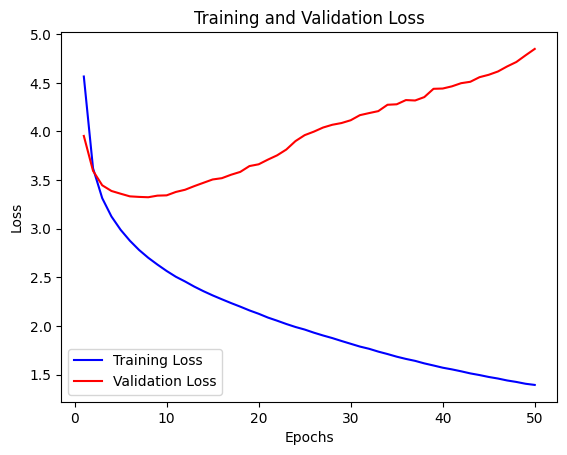

In [ ]:
# prompt: plot val_loss and loss

import matplotlib.pyplot as plt

# Assuming 'history' object contains the training history from model.fit
# history = cap_model.fit(...)

# Access the loss and validation loss
loss = cap_model.history.history['loss']
val_loss = cap_model.history.history['val_loss']

# Plot the loss and validation loss
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_train.pkl'  # Ensure this path is correct

# Deserialization
with open(file_path, 'rb') as file:
    encoding_train = pickle.load(file)

print("Loaded 'encoding_train' successfully.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


In [ ]:

cap_model.save_weights('/content/drive/MyDrive/Image Captioning Dataset/model.weights.h5')


In [ ]:
def predict_caption(photo, model):

    caption = "startseq"
    for i in range(22):
        sequence = [word_to_idx[w] for w in caption.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=31,padding='post')

        ypred = model.predict([photo,sequence])
        ypred = ypred.argmax()
        predicted_word = idx_to_word[ypred]
        caption += ' ' + predicted_word




        if predicted_word == "endseq":
            break


    return caption


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'attention_layer' (of type AttentionLayer) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
startseq man in yellow helmet and blue and black uniform is riding bicycle endseq


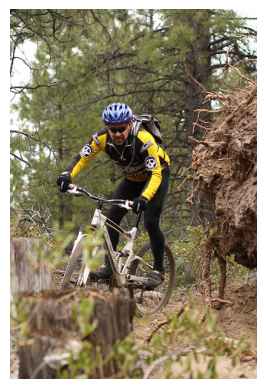

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
startseq professional racer raises smoke on his side endseq


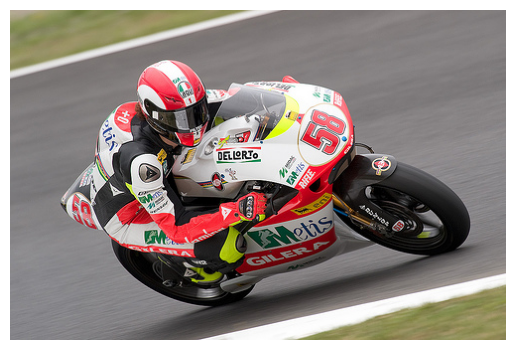

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
startseq man in black jacket and black pants is jumping off of snow jump endseq


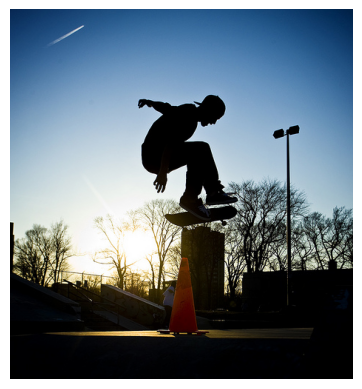

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
startseq boy jumps into the water endseq


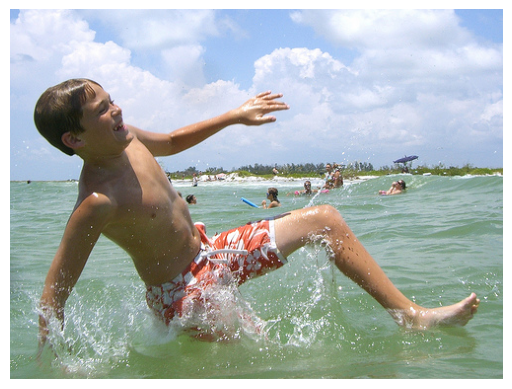

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
startseq man with glasses and hat with white scarf endseq


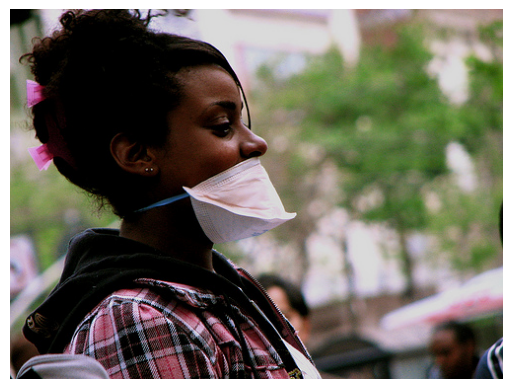

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
startseq two men in suits dance endseq


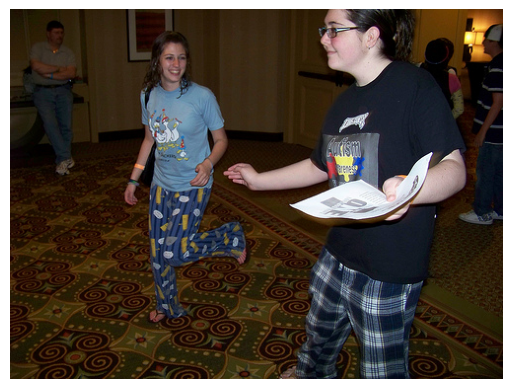

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
startseq black dog jumping over an obstacle endseq


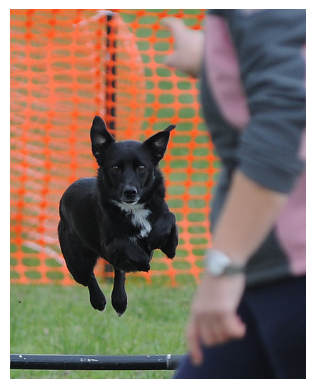

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
startseq group of people are watching man and skateboarder jumping off of ramp endseq


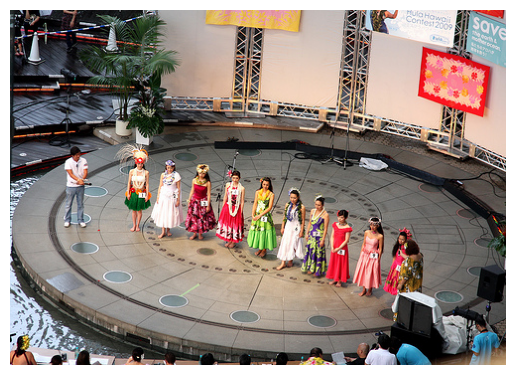

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
startseq boy plays with water outdoors endseq


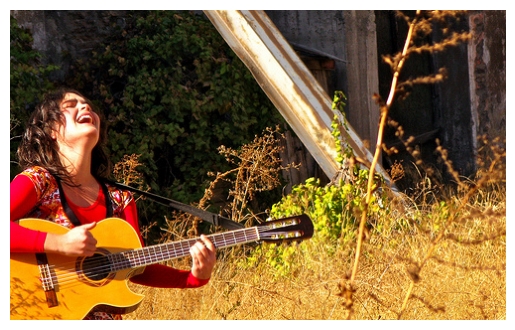

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
startseq man and woman are outside on street endseq


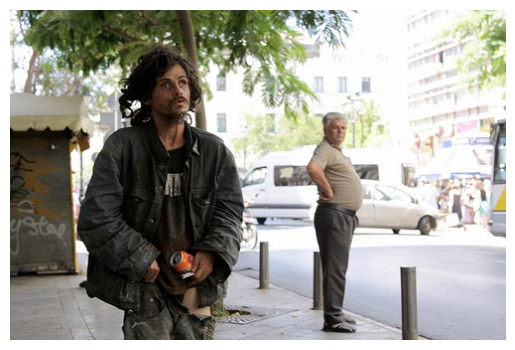

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
startseq two men in orange play basketball endseq


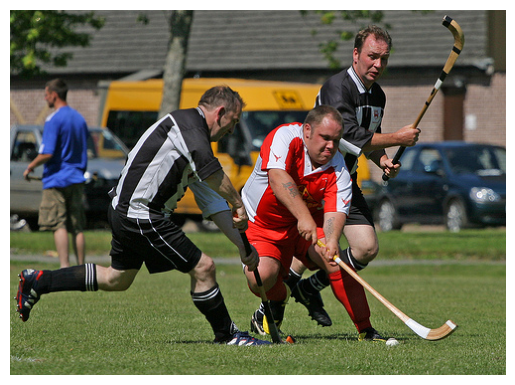

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
startseq man in red shirt playing tennis endseq


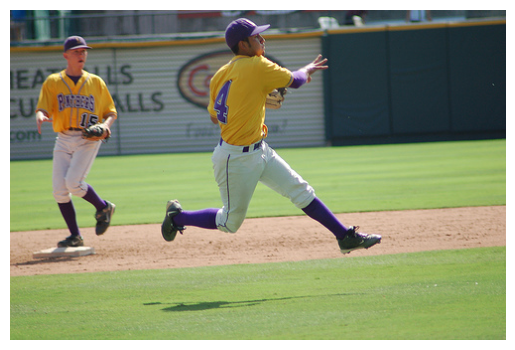

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
startseq the man in the gold shirt is spraying water to the man in the white shirt holds the ball endseq


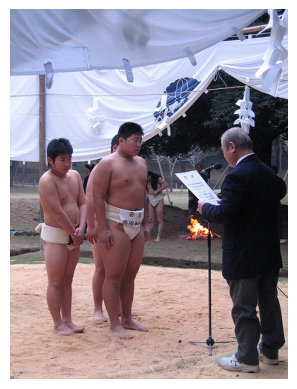

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
startseq black dog grabs white dog in the water endseq


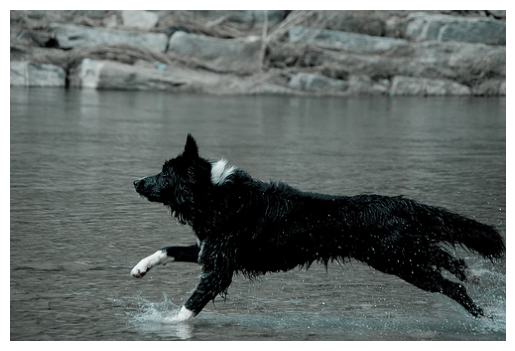

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
startseq brown dog is biting pole endseq


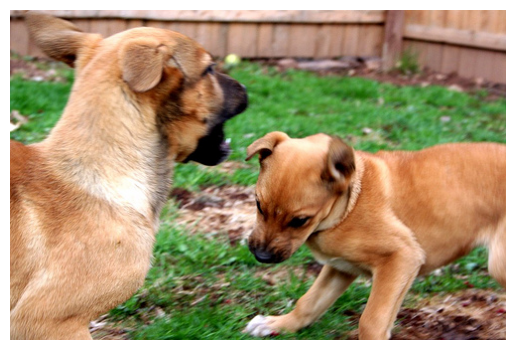

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn


sns.set_theme(style="darkgrid") # Use seaborn to set the style

for i in range(15):
    idx = np.random.randint(0,1000)
    all_img_names = list(test_dict.keys())
    img_name = all_img_names[idx]
    photo_2048 = image_feature(os.path.join("Dataset","Test",img_name)).reshape((1,2048))

    i = plt.imread("Dataset/Test/"+img_name)

    caption = predict_caption(photo_2048,cap_model)
    print(caption)

    # plt.title(caption)
    plt.imshow(i)
    plt.axis("off")
    plt.show()
